In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve

In [36]:
df = pd.read_csv(r"C:\Users\SRIJIT SET\Desktop\GSE130928_cleaned_2.csv")
df_test_1 = pd.read_csv(r"E:\Docking Tools\VALIDATION DATASETS\COPD VALIDATION GSE13896 cleaned.csv")

In [37]:
df = df.drop('ID_REF', axis = 1)
df_test_1 = df_test_1.drop('ID_REF', axis=1)

In [38]:
X

,FCN1,PTX3,CCL2,IFNGR1,CADM1,TIMP3,A2M,SEPP1,C1S,CFB,AIM2,IGFBP2,STAT1,SCD,BNIP3,DDIT4
0,8.37561,5.48409,10.75490,6.81410,7.26685,8.16435,11.83830,4.70542,5.53987,6.40448,6.42749,7.51588,8.40543,7.86707,4.14764,5.98369
1,5.27630,7.57805,11.36180,7.50040,5.64871,9.05922,11.20470,5.56810,6.99537,5.97330,7.89002,4.66245,8.61316,8.03791,5.20543,6.28074
2,7.05077,6.84491,11.44000,6.69632,8.84300,10.32860,10.89960,4.35901,7.11834,7.50438,6.65752,5.05339,8.33852,7.14248,4.78120,6.47808
3,5.66862,7.72868,10.10370,6.80477,5.80325,5.83774,10.08290,5.12148,7.52965,7.81588,8.51417,6.14809,9.04984,7.83688,5.41469,6.28261
4,7.47043,6.45655,11.13730,7.73982,8.91085,5.16756,12.75290,8.42038,6.29938,6.15832,6.61828,5.79276,7.55817,7.94170,5.06303,8.80287
5,5.57091,6.39868,12.41190,8.62520,7.71434,4.51649,10.57330,8.46950,5.66553,6.21225,6.36001,5.23466,7.08397,7.50277,6.31453,9.68041
6,5.32171,9.00036,8.43419,7.72091,5.58356,4.24293,9.02800,4.24124,10.16950,8.99280,9.91404,9.56355,11.02690,10.03540,6.03797,6.17343
7,6.55862,7.55167,9.66970,7.89120,6.14854,6.08635,11.11770,4.45632,6.41612,6.68020,6.93831,7.41945,8.59815,8.99873,6.05865,6.85958
8,7.92619,8.85209,11.03170,8.29863,7.53766,5.42399,10.66470,4.67808,6.86631,6.45739,7.92596,5.21158,9.01273,8.82546,6.51866,6.39008
9,8.36501,6.42643,12.05170,8.96490,7.59563,6.89706,11.27470,7.91327,6.92950,6.33209,7.69067,7.45025,8.96403,8.13842,4.90114,6.38446


In [39]:
X = df.drop('Target',axis = 1)
y = df.Target
X_new_1 = df_test_1.drop('Target', axis = 1)
y_new_1 = df_test_1.Target

In [26]:
X

,FCN1,PTX3,CCL2,IFNGR1,CADM1,TIMP3,A2M,SEPP1,C1S,CFB,AIM2,IGFBP2,STAT1,SCD,BNIP3,DDIT4
0,8.37561,5.48409,10.75490,6.81410,7.26685,8.16435,11.83830,4.70542,5.53987,6.40448,6.42749,7.51588,8.40543,7.86707,4.14764,5.98369
1,5.27630,7.57805,11.36180,7.50040,5.64871,9.05922,11.20470,5.56810,6.99537,5.97330,7.89002,4.66245,8.61316,8.03791,5.20543,6.28074
2,7.05077,6.84491,11.44000,6.69632,8.84300,10.32860,10.89960,4.35901,7.11834,7.50438,6.65752,5.05339,8.33852,7.14248,4.78120,6.47808
3,5.66862,7.72868,10.10370,6.80477,5.80325,5.83774,10.08290,5.12148,7.52965,7.81588,8.51417,6.14809,9.04984,7.83688,5.41469,6.28261
4,7.47043,6.45655,11.13730,7.73982,8.91085,5.16756,12.75290,8.42038,6.29938,6.15832,6.61828,5.79276,7.55817,7.94170,5.06303,8.80287
5,5.57091,6.39868,12.41190,8.62520,7.71434,4.51649,10.57330,8.46950,5.66553,6.21225,6.36001,5.23466,7.08397,7.50277,6.31453,9.68041
6,5.32171,9.00036,8.43419,7.72091,5.58356,4.24293,9.02800,4.24124,10.16950,8.99280,9.91404,9.56355,11.02690,10.03540,6.03797,6.17343
7,6.55862,7.55167,9.66970,7.89120,6.14854,6.08635,11.11770,4.45632,6.41612,6.68020,6.93831,7.41945,8.59815,8.99873,6.05865,6.85958
8,7.92619,8.85209,11.03170,8.29863,7.53766,5.42399,10.66470,4.67808,6.86631,6.45739,7.92596,5.21158,9.01273,8.82546,6.51866,6.39008
9,8.36501,6.42643,12.05170,8.96490,7.59563,6.89706,11.27470,7.91327,6.92950,6.33209,7.69067,7.45025,8.96403,8.13842,4.90114,6.38446


In [40]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
import pickle
pickle.dump(scaler,open('scaling1.pkl','wb'))

In [41]:
X_new_1_scaled = scaler.transform(X_new_1)

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
models = [
        RandomForestClassifier(),
        LogisticRegression(),
        SVC(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(),
        GaussianNB(),
        MLPClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier(),
        AdaBoostClassifier(),
        BaggingClassifier(),
        ExtraTreesClassifier(),
        XGBClassifier()
    ]

f1_scores = []
f1_scores_model = []

for model in models:
    model.fit(X_train, y_train)
    y_pred_1 = model.predict(X_new_1_scaled)
    acc = accuracy_score(y_new_1,y_pred_1)
    print(model)
    print(classification_report(y_new_1, y_pred_1))
    print(acc)

RandomForestClassifier()
              precision    recall  f1-score   support

           0       1.00      0.08      0.15        24
           1       0.35      1.00      0.52        12

    accuracy                           0.39        36
   macro avg       0.68      0.54      0.34        36
weighted avg       0.78      0.39      0.28        36

0.3888888888888889
LogisticRegression()
              precision    recall  f1-score   support

           0       1.00      0.25      0.40        24
           1       0.40      1.00      0.57        12

    accuracy                           0.50        36
   macro avg       0.70      0.62      0.49        36
weighted avg       0.80      0.50      0.46        36

0.5
SVC()
              precision    recall  f1-score   support

           0       0.67      1.00      0.80        24
           1       0.00      0.00      0.00        12

    accuracy                           0.67        36
   macro avg       0.33      0.50      0.40        36

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

MLPClassifier()
              precision    recall  f1-score   support

           0       1.00      0.33      0.50        24
           1       0.43      1.00      0.60        12

    accuracy                           0.56        36
   macro avg       0.71      0.67      0.55        36
weighted avg       0.81      0.56      0.53        36

0.5555555555555556
AdaBoostClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       0.33      1.00      0.50        12

    accuracy                           0.33        36
   macro avg       0.17      0.50      0.25        36
weighted avg       0.11      0.33      0.17        36

0.3333333333333333


C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users

GradientBoostingClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       0.33      1.00      0.50        12

    accuracy                           0.33        36
   macro avg       0.17      0.50      0.25        36
weighted avg       0.11      0.33      0.17        36

0.3333333333333333
AdaBoostClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       0.33      1.00      0.50        12

    accuracy                           0.33        36
   macro avg       0.17      0.50      0.25        36
weighted avg       0.11      0.33      0.17        36

0.3333333333333333
BaggingClassifier()
              precision    recall  f1-score   support

           0       0.67      1.00      0.80        24
           1       0.00      0.00      0.00        12

    accuracy                           0.67        36
   macro avg       0

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

ExtraTreesClassifier()
              precision    recall  f1-score   support

           0       0.67      1.00      0.80        24
           1       0.00      0.00      0.00        12

    accuracy                           0.67        36
   macro avg       0.33      0.50      0.40        36
weighted avg       0.44      0.67      0.53        36

0.6666666666666666
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
  

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

In [44]:
# Setting random seed for reproducibility

model = MLPClassifier()

model.fit(X_train, y_train)
y_pred = model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(model)
print(classification_report(y_test, y_pred))
print("Accuracy of the Testing Set before Hyperparameter Optimization",acc)


MLPClassifier()
              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.67      1.00      0.80         4

    accuracy                           0.80        10
   macro avg       0.83      0.83      0.80        10
weighted avg       0.87      0.80      0.80        10

Accuracy of the Testing Set before Hyperparameter Optimization 0.8


C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [45]:
from sklearn.neural_network import MLPClassifier
np.random.seed(42)
# Define the parameter grid to search
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': [0.001, 0.01, 0.1],
}

# Create an MLPClassifier
mlp = MLPClassifier(max_iter=1000)

# Perform grid search with cross-validation
grid_search = GridSearchCV(mlp, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters:", grid_search.best_params_)

# Get the best MLPClassifier model
best_mlp = grid_search.best_estimator_

# Fit the best model to the data
best_mlp.fit(X_train, y_train)

# Make predictions
y_pred = best_mlp.predict(X_test)

# Evaluate the model
acc_test = accuracy_score(y_test, y_pred)
print("Classification report of the Testing Set", classification_report(y_test,y_pred))
print("Accuracy of the Testing Set after Hyperparameter optimization", acc_test)


C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10

Best parameters: {'activation': 'logistic', 'hidden_layer_sizes': (50, 50), 'learning_rate_init': 0.1, 'solver': 'adam'}
Classification report of the Testing Set               precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.75      0.75      0.75         4

    accuracy                           0.80        10
   macro avg       0.79      0.79      0.79        10
weighted avg       0.80      0.80      0.80        10

Accuracy of the Testing Set after Hyperparameter optimization 0.8


In [46]:
np.random.seed(42)

y_pred_1 = best_mlp.predict(X_new_1_scaled)
acc_val = accuracy_score(y_new_1, y_pred_1)
print(model)
print("Classification Report of the Validation Set", classification_report(y_new_1, y_pred_1))
print("Accuracy of the Validation Set", acc_val)

MLPClassifier()
Classification Report of the Validation Set               precision    recall  f1-score   support

           0       1.00      0.62      0.77        24
           1       0.57      1.00      0.73        12

    accuracy                           0.75        36
   macro avg       0.79      0.81      0.75        36
weighted avg       0.86      0.75      0.76        36

Accuracy of the Validation Set 0.75


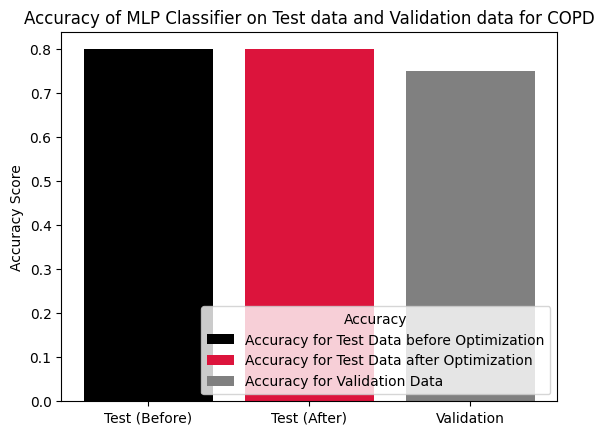

In [47]:
fig, ax = plt.subplots()
categories = ["Test (Before)", "Test (After)", "Validation"]
values = [acc_test,acc_test,acc_val]
bar_color = ["black","crimson","grey"]
bar_labels = ["Accuracy for Test Data before Optimization","Accuracy for Test Data after Optimization","Accuracy for Validation Data"]
ax.bar(categories, values, label = bar_labels, color = bar_color)

ax.set_ylabel('Accuracy Score')
ax.set_title('Accuracy of MLP Classifier on Test data and Validation data for COPD')
ax.legend(title='Accuracy',loc='lower right')

plt.show()

In [12]:
coeffs = best_mlp.coefs_
print(coeffs)

[array([[-0.13098127, -0.01877898,  0.00040625,  0.08537955,  0.15888934,
         0.15137849, -0.0659132 ,  0.01442351,  0.01045331,  0.21858804,
        -0.15160358,  0.0488872 , -0.19891799, -0.05662339, -0.0656057 ,
         0.22736324, -0.12066158,  0.08630598, -0.05896469, -0.10654366,
         0.16004821,  0.00224746,  0.20224853, -0.18673221, -0.02646181,
        -0.15006714,  0.10307408,  0.15603271, -0.18223072, -0.14520414,
         0.17046082, -0.05278207,  0.06558365, -0.1134023 , -0.04668712,
         0.12832487,  0.19878536,  0.03720691,  0.02163107,  0.00402254,
        -0.02482685, -0.11933488,  0.02874711,  0.05272689, -0.16057852,
        -0.1101292 ,  0.13871015,  0.03248121, -0.18518651,  0.11734137],
       [-0.17535596,  0.19389624,  0.06289778, -0.07514421,  0.005908  ,
        -0.01204276,  0.12051752,  0.15016814,  0.00615506,  0.03920457,
         0.03400899,  0.12865556, -0.12120007,  0.17186135,  0.05553901,
         0.14447297, -0.05030286, -0.11542238, -0

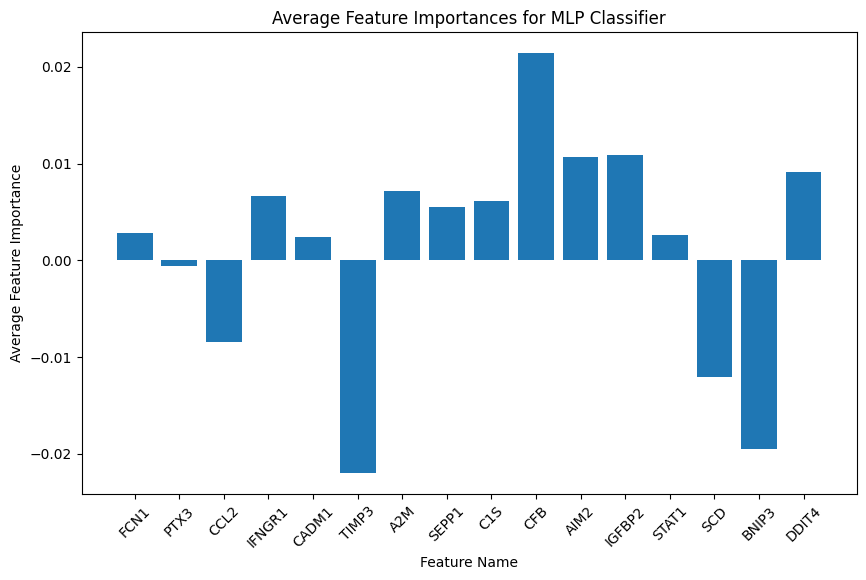

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming feature_importances contains your feature importances
# and feature_names contains your feature names
feature_names = X.columns
# Compute average feature importance across all neurons
average_feature_importance = np.mean(feature_importances, axis=1)

# Plot average feature importance with feature names
plt.figure(figsize=(10, 6))
plt.bar(range(len(average_feature_importance)), average_feature_importance)
plt.xlabel('Feature Name')
plt.ylabel('Average Feature Importance')
plt.title('Average Feature Importances for MLP Classifier')
plt.xticks(range(len(average_feature_importance)), feature_names, rotation=45)
plt.show()


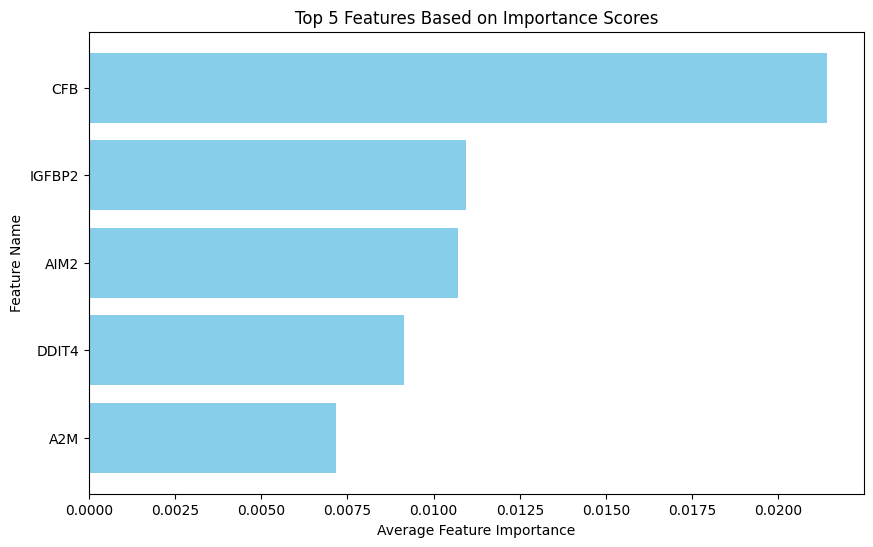

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming feature_importances contains your feature importances
# and feature_names contains your feature names

# Compute average feature importance across all neurons
average_feature_importance = np.mean(feature_importances, axis=1)

# Get indices of top 5 features based on importance scores
top_5_indices = np.argsort(average_feature_importance)[-5:][::-1]  # Indices of top 5 features in descending order

# Select top 5 features and their corresponding importance scores
top_5_features = [feature_names[i] for i in top_5_indices]
top_5_scores = average_feature_importance[top_5_indices]

# Plot top 5 features with their importance scores
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_5_features)), top_5_scores, color='skyblue')
plt.xlabel('Average Feature Importance')
plt.ylabel('Feature Name')
plt.title('Top 5 Features Based on Importance Scores')
plt.yticks(range(len(top_5_features)), top_5_features)
plt.gca().invert_yaxis()  # Invert y-axis to display top features at the top
plt.show()


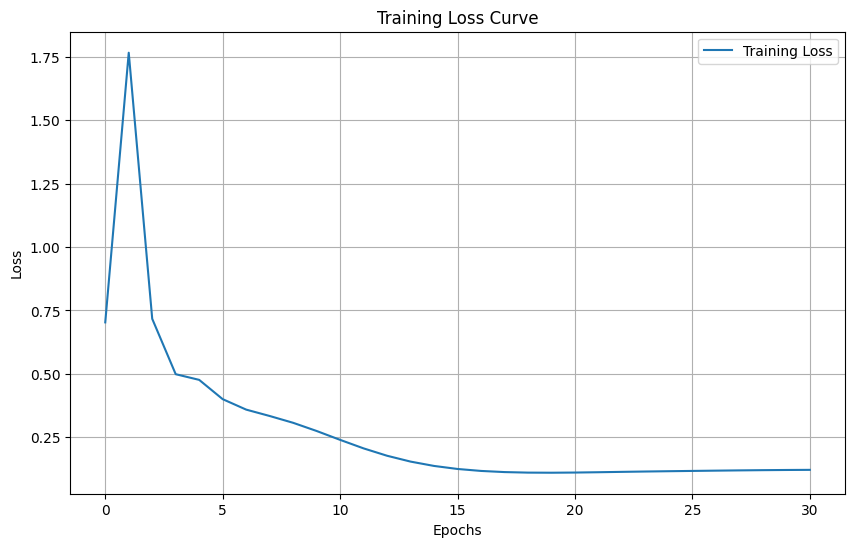

In [13]:
import matplotlib.pyplot as plt

# Access the loss curve from the best MLPClassifier model
train_loss = best_mlp.loss_curve_

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Training Loss')
plt.title('Training Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


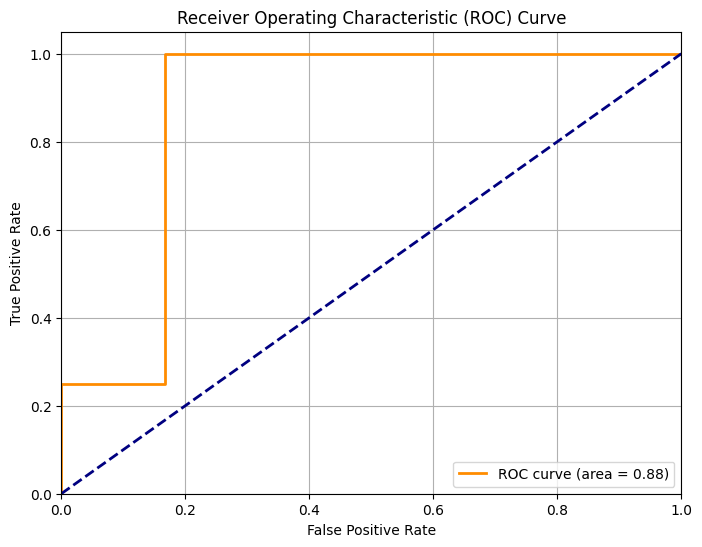

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class
y_score = best_mlp.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [14]:
print("Accuracy of the Testing Set before Hyperparameter Optimization",acc)
print("Accuracy of the Testing Set after Hyperparameter optimization", acc_test)
print("Accuracy of the Validation Set", acc_val)

Accuracy of the Testing Set before Hyperparameter Optimization 0.84
Accuracy of the Testing Set after Hyperparameter optimization 0.9473684210526315
Accuracy of the Validation Set 0.8


In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve

models = [
        RandomForestClassifier(),
        LogisticRegression(),
        SVC(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(),
        GaussianNB(),
        MLPClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier(),
        AdaBoostClassifier(),
        BaggingClassifier(),
        ExtraTreesClassifier(),
        XGBClassifier()
    ]

f1_scores = []
f1_scores_model = []

for model in models:
    model.fit(X_train, y_train)
    y_pred_1 = model.predict(X_new_1_scaled)
    acc = accuracy_score(y_new_1,y_pred_1)
    print(model)
    print(classification_report(y_new_1, y_pred_1))
    print(acc)

RandomForestClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5
LogisticRegression()
              precision    recall  f1-score   support

           0       1.00      0.36      0.53        25
           1       0.61      1.00      0.76        25

    accuracy                           0.68        50
   macro avg       0.80      0.68      0.64        50
weighted avg       0.80      0.68      0.64        50

0.68
SVC()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg 

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

DecisionTreeClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5
KNeighborsClassifier()
              precision    recall  f1-score   support

           0       1.00      0.20      0.33        25
           1       0.56      1.00      0.71        25

    accuracy                           0.60        50
   macro avg       0.78      0.60      0.52        50
weighted avg       0.78      0.60      0.52        50

0.6
GaussianNB()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weigh

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

MLPClassifier()
              precision    recall  f1-score   support

           0       1.00      0.68      0.81        25
           1       0.76      1.00      0.86        25

    accuracy                           0.84        50
   macro avg       0.88      0.84      0.84        50
weighted avg       0.88      0.84      0.84        50

0.84
AdaBoostClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5


C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users

GradientBoostingClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5
AdaBoostClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5
BaggingClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33       

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

ExtraTreesClassifier()
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

0.5


C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25 

C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_

In [23]:
!pip install lime


[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


     ---------------------------------------- 0.0/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---- ----------------------------------- 30.7/275.7 kB ? eta -:--:--
     ---------- -------------------------- 81.9/275.7 kB 135.0 kB/s eta 0:00:02
     ---------- -------------------------- 81.9/275.7 kB 135.0 kB/s eta 0:00:02
     ------------ ------------------------ 92.2/275.7 kB 127.8 kB/s eta 0:00:02
     -------------- --------------------- 112.6/275.7 kB 156.1 kB/s eta 0:00:02
     ----------

In [15]:
from sklearn.neural_network import MLPClassifier
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
feature_names= X.columns
# 4. Create a LIME explainer
explainer = LimeTabularExplainer(X_train, mode="classification", feature_names = feature_names)

# 5. Explain predictions
for i in range(len(X_test)):
    exp = explainer.explain_instance(X_test[i], best_mlp.predict_proba)
    exp.show_in_notebook(show_table=True)

In [39]:
X_test[1]

array([ 0.31641406, -0.68301816,  0.14824823,  0.37680769,  1.05179098,
       -0.70184127,  0.11439219, -1.25889125, -0.81409159, -0.09075853,
       -0.24134667,  0.20682728, -0.62448793,  0.24122717,  0.74377793,
       -1.20319785])

In [43]:
from sklearn.neural_network import MLPClassifier
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# Assuming X_train and X_test are your training and test data, respectively
feature_names = X.columns

# 4. Create a LIME explainer
explainer = LimeTabularExplainer(X_train, mode="classification", feature_names=feature_names)

# 5. Explain predictions
exp = explainer.explain_instance(X_test[2], best_mlp.predict_proba)


In [44]:
exp.as_list()

[('IFNGR1 > 0.60', -0.11374508050770002),
 ('IGFBP2 <= -0.80', -0.09287629956784635),
 ('CCL2 > 0.73', -0.08884891819875378),
 ('STAT1 <= -0.55', -0.08113035799716801),
 ('0.32 < A2M <= 0.91', -0.07008918222480548),
 ('AIM2 > 0.46', 0.06795585071677508),
 ('PTX3 > 0.68', -0.06025995410157552),
 ('SCD <= -0.68', -0.057305062313450186),
 ('0.09 < SEPP1 <= 0.80', -0.0566393964488376),
 ('C1S <= -0.45', -0.046870568359904975)]

In [51]:
len(X_test)

19

In [61]:
from sklearn.neural_network import MLPClassifier
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# Assuming X_train, X_test, y_train, y_test are your data split
# and best_mlp is your trained MLPClassifier

# Convert X_train and X_test to pandas DataFrame if they are numpy arrays
X_train_df = pd.DataFrame(X_train, columns=feature_names)
X_test_df = pd.DataFrame(X_test, columns=feature_names)

# Create a LIME explainer
explainer = LimeTabularExplainer(X_train_df.values, mode="classification", feature_names=feature_names)

# Initialize aggregate feature importance scores and total instance count
aggregate_importance = []
total_instances = 0

for i in range(len(X_train)):
    exp = explainer.explain_instance(X_train_df.values[i], best_mlp.predict_proba)
    
    # Convert feature importance to numerical values
    feature_importance = np.array([abs(val) for _, val in exp.as_list()])
    
    # Append feature importance scores
    aggregate_importance.append(feature_importance)
    total_instances += 1

# Convert aggregate_importance to numpy array
aggregate_importance = np.array(aggregate_importance)

# Calculate average importance
average_importance = np.mean(aggregate_importance, axis=0)

# Rank features based on average importance
feature_ranking = sorted(zip(feature_names, average_importance), key=lambda x: -x[1])

# Print feature ranking
for rank, (feature, importance) in enumerate(feature_ranking, start=1):
    print(f"Rank {rank}: {feature} - Importance: {importance}")


Rank 1: FCN1 - Importance: 0.13951665925613566
Rank 2: PTX3 - Importance: 0.11577772817173931
Rank 3: CCL2 - Importance: 0.1011796913370329
Rank 4: IFNGR1 - Importance: 0.09061713779670769
Rank 5: CADM1 - Importance: 0.08113619269085724
Rank 6: TIMP3 - Importance: 0.07055834887461004
Rank 7: A2M - Importance: 0.06014567234955919
Rank 8: SEPP1 - Importance: 0.05082673799517254
Rank 9: C1S - Importance: 0.0435656630220681
Rank 10: CFB - Importance: 0.03820518129352889


In [62]:
X.columns

Index(['FCN1', 'PTX3', 'CCL2', 'IFNGR1', 'CADM1', 'TIMP3', 'A2M', 'SEPP1',
       'C1S', 'CFB', 'AIM2', 'IGFBP2', 'STAT1', 'SCD', 'BNIP3', 'DDIT4'],
      dtype='object')

In [63]:
# Define a function to calculate permutation importance
def permutation_importance(model, X, y, metric, random_state=42):
    baseline = metric(y, model.predict(X))
    imp = []
    rng = np.random.RandomState(random_state)
    for col in range(X.shape[1]):
        X_permuted = X.copy()
        rng.shuffle(X_permuted[:, col])
        permuted_score = metric(y, model.predict(X_permuted))
        imp.append(baseline - permuted_score)
    return np.array(imp)

# Calculate permutation importance
permutation_imp = permutation_importance(best_mlp, X_test, y_test, accuracy_score)

# Print permutation importance for each feature
for i, imp in enumerate(permutation_imp):
    print(f"Feature {i}: {imp}")

# You can also normalize the importance scores if needed
normalized_importance = permutation_imp / np.sum(permutation_imp)
print("Normalized Permutation Importance:")
for i, imp in enumerate(normalized_importance):
    print(f"Feature {i}: {imp}")

Feature 0: 0.0
Feature 1: 0.052631578947368474
Feature 2: 0.052631578947368474
Feature 3: 0.0
Feature 4: 0.0
Feature 5: 0.052631578947368474
Feature 6: 0.052631578947368474
Feature 7: 0.10526315789473684
Feature 8: 0.0
Feature 9: 0.052631578947368474
Feature 10: 0.052631578947368474
Feature 11: 0.052631578947368474
Feature 12: 0.052631578947368474
Feature 13: 0.0
Feature 14: 0.0
Feature 15: 0.0
Normalized Permutation Importance:
Feature 0: 0.0
Feature 1: 0.10000000000000002
Feature 2: 0.10000000000000002
Feature 3: 0.0
Feature 4: 0.0
Feature 5: 0.10000000000000002
Feature 6: 0.10000000000000002
Feature 7: 0.19999999999999984
Feature 8: 0.0
Feature 9: 0.10000000000000002
Feature 10: 0.10000000000000002
Feature 11: 0.10000000000000002
Feature 12: 0.10000000000000002
Feature 13: 0.0
Feature 14: 0.0
Feature 15: 0.0


In [66]:
feature_names = X.columns
# Define a function to calculate permutation importance with feature names
def permutation_importance_with_names(model, X, y, metric, feature_names, random_state=42):
    baseline = metric(y, model.predict(X))
    imp = {}
    rng = np.random.RandomState(random_state)
    for col, name in enumerate(feature_names):
        X_permuted = X.copy()
        rng.shuffle(X_permuted[:, col])
        permuted_score = metric(y, model.predict(X_permuted))
        imp[name] = baseline - permuted_score
    return imp

# Calculate permutation importance with feature names
permutation_imp = permutation_importance_with_names(best_mlp, X_test, y_test, accuracy_score, feature_names)

# Print permutation importance for each feature
for feature, importance in permutation_imp.items():
    print(f"{feature}: {importance}")

# You can also normalize the importance scores if needed
total_importance = sum(permutation_imp.values())
normalized_importance = {feature: importance / total_importance for feature, importance in permutation_imp.items()}
print("Normalized Permutation Importance:")
for feature, importance in normalized_importance.items():
    print(f"{feature}: {importance}")

FCN1: 0.0
PTX3: 0.052631578947368474
CCL2: 0.052631578947368474
IFNGR1: 0.0
CADM1: 0.0
TIMP3: 0.052631578947368474
A2M: 0.052631578947368474
SEPP1: 0.10526315789473684
C1S: 0.0
CFB: 0.052631578947368474
AIM2: 0.052631578947368474
IGFBP2: 0.052631578947368474
STAT1: 0.052631578947368474
SCD: 0.0
BNIP3: 0.0
DDIT4: 0.0
Normalized Permutation Importance:
FCN1: 0.0
PTX3: 0.10000000000000002
CCL2: 0.10000000000000002
IFNGR1: 0.0
CADM1: 0.0
TIMP3: 0.10000000000000002
A2M: 0.10000000000000002
SEPP1: 0.19999999999999984
C1S: 0.0
CFB: 0.10000000000000002
AIM2: 0.10000000000000002
IGFBP2: 0.10000000000000002
STAT1: 0.10000000000000002
SCD: 0.0
BNIP3: 0.0
DDIT4: 0.0


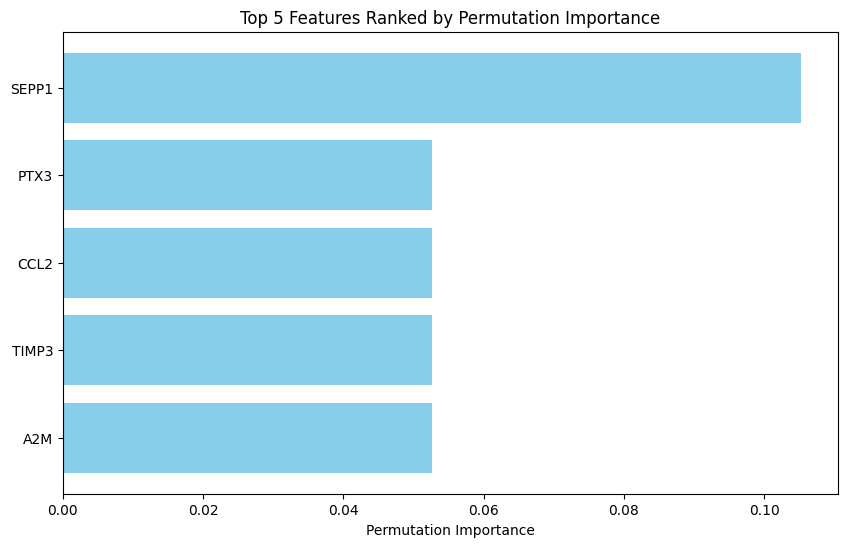

In [110]:
import matplotlib.pyplot as plt

# Sort the permutation importance dictionary by values in descending order
sorted_importance = sorted(permutation_imp.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 features and their importance scores
top_features = [feature for feature, _ in sorted_importance[:5]]
top_importance = [importance for _, importance in sorted_importance[:5]]

# Plot the top 5 features and their importance scores
plt.figure(figsize=(10, 6))
plt.barh(top_features, top_importance, color='skyblue')
plt.xlabel('Permutation Importance')
plt.title('Top 5 Features Ranked by Permutation Importance')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
plt.show()


In [16]:
!pip install mlxtend  
from mlxtend.evaluate import feature_importance_permutation



[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


In [17]:
imp_vals, _ = feature_importance_permutation(
    predict_method=best_mlp.predict, 
    X=X_test,
    y=y_test,
    metric='accuracy',
    num_rounds=1,
    seed=1)

imp_vals

array([ 0.1,  0.1, -0.1,  0. ,  0. ,  0. ,  0.1,  0. ,  0. ,  0. , -0.1,
        0. ,  0. ,  0. ,  0. ,  0. ])

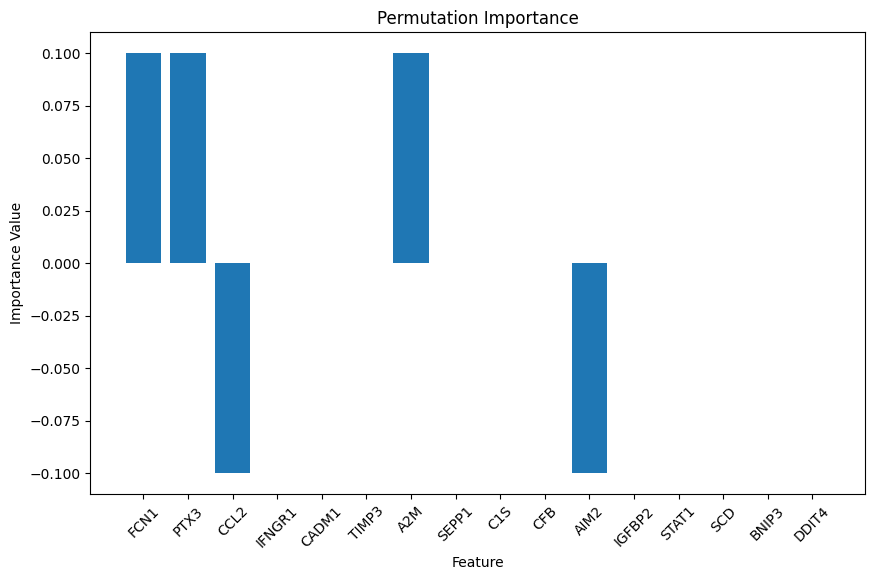

In [18]:
import matplotlib.pyplot as plt
feature_names = X.columns
# Assuming you have already computed the feature importances
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(imp_vals)), imp_vals, align='center')
plt.xticks(range(len(imp_vals)), feature_names, rotation=45)
plt.xlabel('Feature')
plt.ylabel('Importance Value')
plt.title('Permutation Importance')
plt.show()


In [119]:
indices = np.argsort(imp_vals)[::-1]
plt.figure()
plt.title("Random Forest feature importance via permutation importance")
plt.bar(range(X.shape[1]), imp_vals[indices])
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.ylim([0, 0.5])
plt.show()

array([[ 1.25093198e+00, -1.06429142e+00, -2.23823123e+00,
        -9.14547158e-01,  1.26128601e+00],
       [-1.96282571e-01,  1.90819806e-01, -2.43383979e-01,
         1.54803751e-01, -2.56094131e-01],
       [ 2.65913813e+00, -2.65772975e-01,  1.07297805e+00,
        -9.96758275e-01, -2.19556389e+00],
       [ 8.77784313e-02, -2.10106903e-02, -6.67779556e-01,
        -3.87093133e-02, -4.25858895e-02],
       [-6.62456530e-01,  7.41042542e-01, -3.58340152e-01,
         5.68498521e-01, -1.10129850e+00],
       [-2.01991518e+00,  1.40059258e+00,  4.98221748e-01,
         1.32589073e+00, -1.26004874e+00],
       [ 1.02964288e+00, -3.47435302e-01,  9.21650112e-01,
        -5.01971907e-01, -2.52892539e-01],
       [-2.09649946e+00,  1.41120191e+00, -3.01951216e+00,
         1.35599980e+00, -1.20403304e+00],
       [-2.72451497e-01,  3.52714014e-01,  7.50579168e-01,
         2.56555624e-01, -5.70033885e-01],
       [ 1.67941084e+00, -1.16697670e+00, -3.87130650e-01,
        -1.10356058e+00

In [113]:
!pip install eli5==0.11.0

import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(best_mlp, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X.columns.tolist())

  Obtaining dependency information for eli5==0.11.0 from https://files.pythonhosted.org/packages/d1/54/04cab6e1c0ae535bec93f795d8403fdf6caf66fa5a6512263202dbb14ea6/eli5-0.11.0-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/106.0 kB ? eta -:--:--
   --------------- ----------------------- 41.0/106.0 kB 653.6 kB/s eta 0:00:01
   -------------------------- ------------ 71.7/106.0 kB 653.6 kB/s eta 0:00:01
   -------------------------- ------------ 71.7/106.0 kB 653.6 kB/s eta 0:00:01
   -------------------------------------- 106.0/106.0 kB 509.5 kB/s eta 0:00:00
  Attempting uninstall: eli5
    Found existing installation: eli5 0.13.0
    Uninstalling eli5-0.13.0:
      Successfully uninstalled eli5-0.13.0



[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


ImportError: cannot import name 'if_delegate_has_method' from 'sklearn.utils.metaestimators' (C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\metaestimators.py)

In [69]:
!pip install pdpbox



[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


  Obtaining dependency information for pdpbox from https://files.pythonhosted.org/packages/1f/2e/8f115e0c514f2057fd8a99a01f52a5cd7d6952adf98dcffae086c2bccff6/PDPbox-0.3.0-py3-none-any.whl.metadata
  Obtaining dependency information for plotly>=5.9.0 from https://files.pythonhosted.org/packages/27/ae/c9fb759b36bc55ccc382b647d1afc23c2a860be8e835f96249996d0aa4df/plotly-5.19.0-py3-none-any.whl.metadata
  Obtaining dependency information for pqdm>=0.2.0 from https://files.pythonhosted.org/packages/9e/b7/720988acdc9b5805cd1ef311aa75d6fd1c5438b87f4add1ec8d11f78d63b/pqdm-0.2.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for pytest from https://files.pythonhosted.org/packages/5a/4a/3f626e3974bea1e6d471bd86f7965c67cd06d5770d1fec9aae445c44da7b/pytest-8.1.0-py3-none-any.whl.metadata
  Obtaining dependency information for sphinx>=5.0.2 from https://files.pythonhosted.org/packages/b2/b6/8ed35256aa530a9d3da15d20bdc0ba888d5364441bb50a5a83ee7827affe/sphinx-7.2.6-py3-none-any.whl.me

ImportError: cannot import name 'get_dataset' from 'pdpbox' (C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\Lib\site-packages\pdpbox\__init__.py)

In [76]:
from pdpbox import pdp

# Assuming X_train is your training data and best_mlp is your trained MLP classifier

# Loop through each feature in X_train
for feature_name in X.columns:
    pdp_data = pdp.pdp_isolate(model=best_mlp, dataset=X_train, model_features=X_train.columns, feature=feature_name)
    pdp.pdp_plot(pdp_data, feature_name)


AttributeError: module 'pdpbox.pdp' has no attribute 'pdp_isolate'

In [ ]:
# Assuming X_train is your training data and best_mlp is your trained MLP classifier
from pdpbox import pdp

# Loop through each feature in X_train
for feature_name in X_train.columns:
    pdp_data = pdp.pdp_isolate(model=best_mlp, dataset=X_train, model_features=X_train.columns, feature=feature_name)
    pdp.pdp_plot(pdp_data, feature_name)


In [78]:
!pip install shap
import shap

# compute SHAP values
explainer = shap.Explainer(lambda x: best_mlp.predict_log_proba(x)[:, 1], X_train)
shap_values = explainer(X_train[:1000])


[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


  Obtaining dependency information for shap from https://files.pythonhosted.org/packages/a3/89/f5cca6e299320e19194ad09f6014db33208a49e8d9161e729725eb17f8a8/shap-0.44.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for slicer==0.0.7 from https://files.pythonhosted.org/packages/78/c2/b3f55dfdb8af9812fdb9baf70cacf3b9e82e505b2bd4324d588888b81202/slicer-0.0.7-py3-none-any.whl.metadata
  Obtaining dependency information for numba from https://files.pythonhosted.org/packages/d9/34/8418e2eab1c22b07158de3f4dc7616628c823c042ba7c71a7a2e5b1b4195/numba-0.59.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for cloudpickle from https://files.pythonhosted.org/packages/96/43/dae06432d0c4b1dc9e9149ad37b4ca8384cf6eb7700cd9215b177b914f0a/cloudpickle-3.0.0-py3-none-any.whl.metadata
  Obtaining dependency information for llvmlite<0.43,>=0.42.0dev0 from https://files.pythonhosted.org/packages/f3/bd/3b27a1c8bbbe01b053f5e0c9ca9a37dbc3e39282dfcf596d143ad389f156/llv

PermutationExplainer explainer: 73it [00:25,  2.79it/s]                                                                


In [24]:
from sklearn.inspection import PartialDependenceDisplay

features = X.columns
PartialDependenceDisplay.from_estimator(best_mlp, X_test, features)

ValueError: Feature 'FCN1' not in feature_names

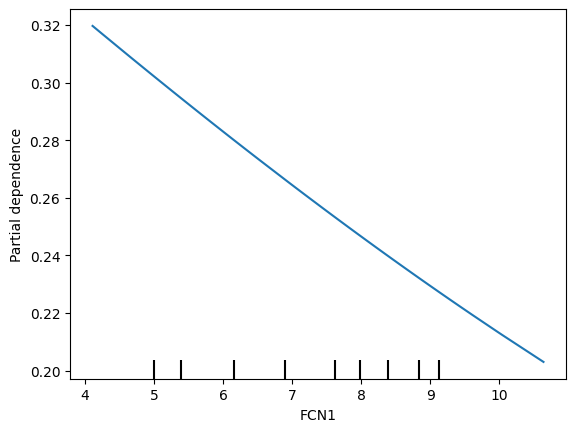

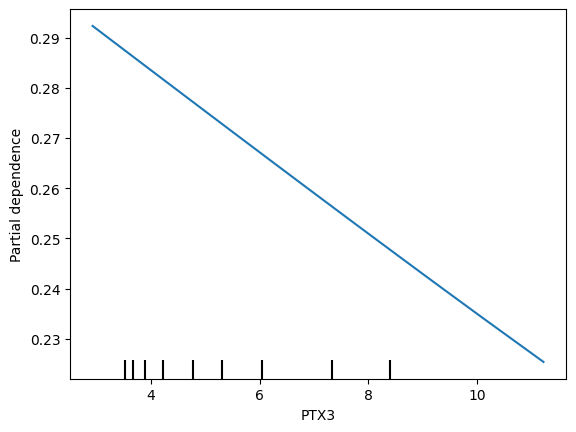

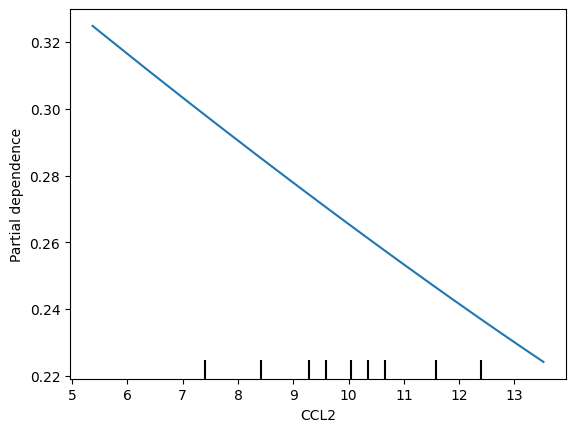

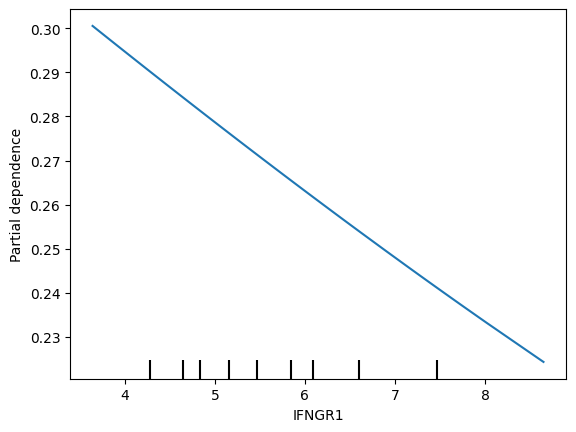

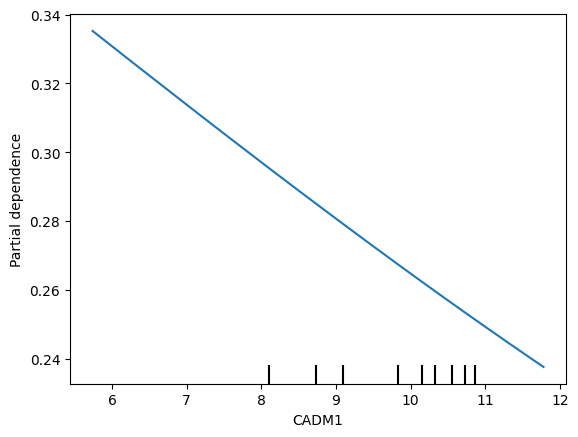

...

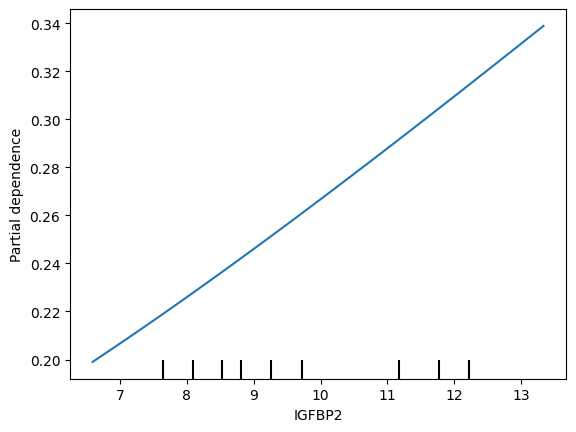

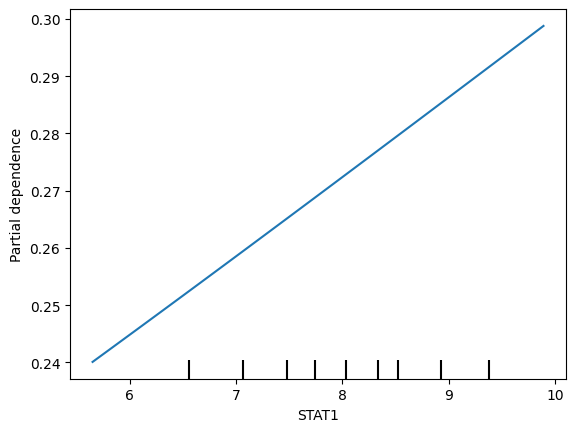

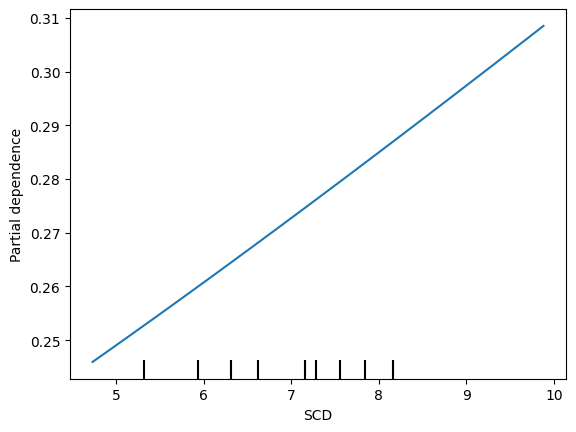

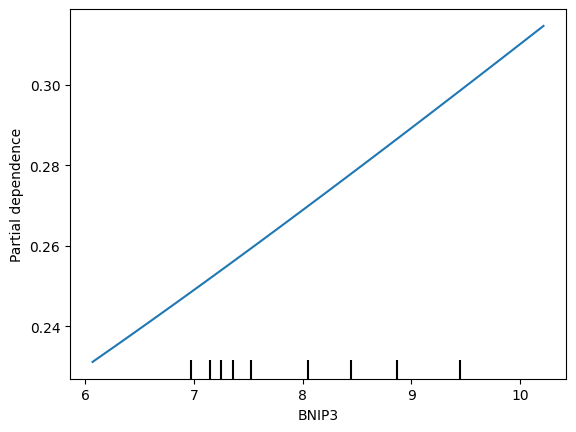

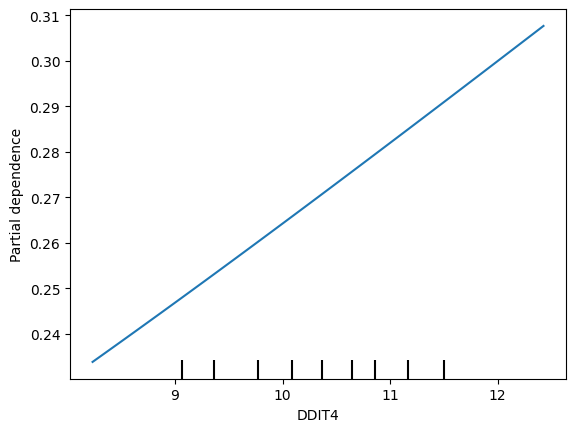

In [100]:
from sklearn.inspection import PartialDependenceDisplay

# Assuming 'X' is your feature matrix and 'best_mlp' is your fitted MLP model
features = X.columns

for i in range(16):# Specify the index of the feature for which you want to plot the partial dependence
    feature_index = i  # Index of the feature you want to plot (e.g., the first feature)

# Create a PartialDependenceDisplay object for the specified feature
    display = PartialDependenceDisplay.from_estimator(best_mlp, X, features=[features[feature_index]])



In [101]:
import shap

# Create an explainer object
explainer = shap.Explainer(best_mlp, X_train)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Get the expected value (average prediction) from the model
expected_value = explainer.expected_value

# Plot the SHAP values for a specific instance (e.g., first instance in the test set)
shap.force_plot(expected_value, shap_values[0,:], X_test.iloc[0,:])


TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: MLPClassifier(activation='logistic', hidden_layer_sizes=(50,), max_iter=1000,
              solver='sgd')

In [19]:
!pip install shap
import shap
explainer = shap.KernelExplainer(best_mlp.predict_proba,X_test)
shap_values = explainer.shap_values(X_test)


[notice] A new release of pip is available: 23.2 -> 24.0
[notice] To update, run: C:\Users\SRIJIT SET\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


  0%|          | 0/10 [00:00<?, ?it/s]

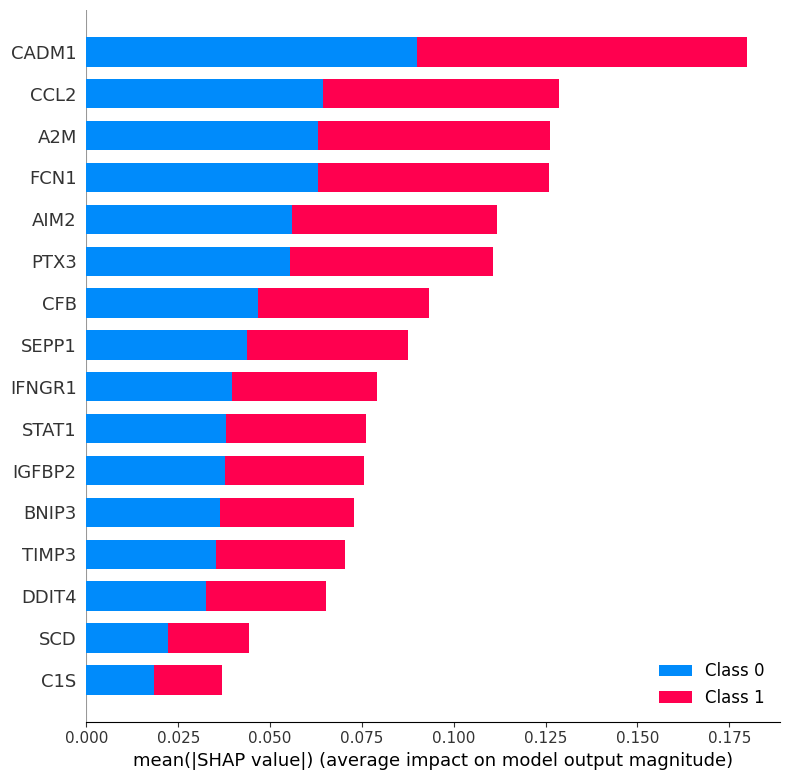

In [20]:
shap.summary_plot(shap_values, X_test,feature_names= X.columns, plot_type="bar")

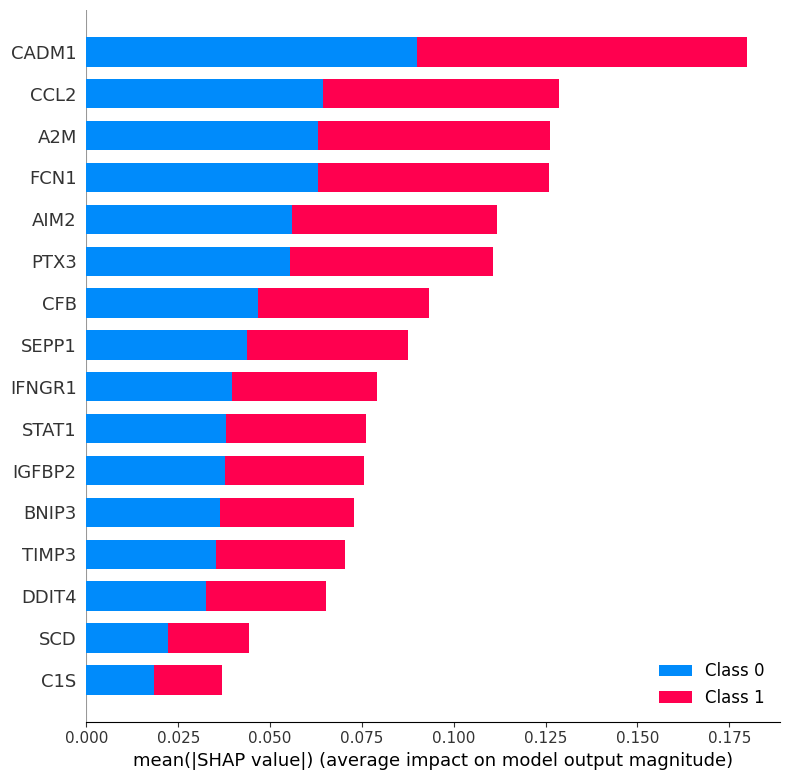

In [21]:
shap.summary_plot(shap_values,X_test,feature_names= X.columns )

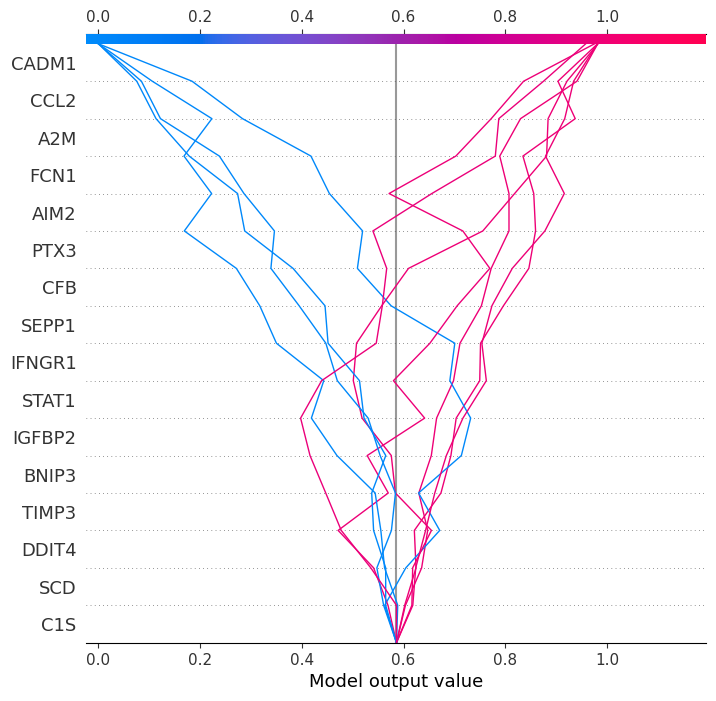

In [22]:
shap.decision_plot(explainer.expected_value[0], shap_values[0], X.columns)


In [ ]:
import pickle

# Pickling the model
with open("best_mlp1.pkl", "wb") as f:
    pickle.dump(best_mlp, f)


In [ ]:
pickled_model = pickle.load(open('best_mlp1.pkl','rb'))

In [ ]:
## Prediction
pickled_model.predict(scaler.transform(X_new_1_scaled[0].reshape(1,-1)))